# Euprymna scolopes midstage embryo

## read in cellbender filtered counts

In [1]:
# activate cellbender kernel
from cellbender.remove_background.downstream import load_anndata_from_input_and_output

In [2]:
Esco_cb_path = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/cellbender_ncbi/'


In [ ]:
E_1 = load_anndata_from_input_and_output(
    input_file= '/staging/leuven/stg_00171/Mark/ESco_Dec2022_mid-embryo_scMO/CR_ARC_counts_ncbi_genome/ESE003/outs/raw_feature_bc_matrix.h5',
    output_file= Esco_cb_path + 'ESE003_cellbender_out_filtered.h5',
    input_layer_key='raw',  # this will be the raw data layer
)
E_1

In [ ]:
E_2 = load_anndata_from_input_and_output(
    input_file= '/staging/leuven/stg_00171/Mark/ESco_Dec2022_mid-embryo_scMO/CR_ARC_counts_ncbi_genome/ESE004/outs/raw_feature_bc_matrix.h5',
    output_file= Esco_cb_path + 'ESE004_cellbender_out_filtered.h5',
    input_layer_key='raw',  # this will be the raw data layer
)
E_2

In [110]:
save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'

In [6]:
# save before starting scanpy kernel
import anndata as ad
# save as h5ad files for scanpy
E_1.write_h5ad(filename=save_dir + 'adata_E_1_cb.h5ad')
E_2.write_h5ad(filename=save_dir + 'adata_E_2_cb.h5ad')


# Scanpy

In [64]:
# start scanpy kernel
import scanpy as sc
save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'

# save as h5ad files for scanpy
E_1 = sc.read_h5ad(filename=save_dir + 'adata_E_1_cb.h5ad')
E_2 = sc.read_h5ad(filename=save_dir + 'adata_E_2_cb.h5ad')


In [65]:
adata_list = [E_1, E_2]

In [66]:
for adata in adata_list:
    sc.pp.filter_cells(adata, min_genes=100)
    sc.pp.filter_genes(adata, min_cells=5)
    print(adata)

AnnData object with n_obs × n_vars = 13486 × 118345
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positive_rate'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'
AnnData object with n_obs × n_vars = 14644 × 142336
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'dr

In [22]:
# mitochondrial genes:
import pandas as pd
feature_table = pd.read_csv('/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/cellranger_ncbi_genome/GCF_053919585.1_ASM5391958v1_feature_table.txt', sep='\t')

In [34]:
mask = feature_table.astype(str).apply(
    lambda col: col.str.contains("mitochondrial", na=False)
)

mito = feature_table[mask.any(axis=1)]

In [35]:
mito.head()

,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,product_accession,non-redundant_refseq,related_accession,name,symbol,GeneID,locus_tag,feature_interval_length,product_length,attributes
521,gene,protein_coding,GCF_053919585.1,Primary Assembly,chromosome,1.0,NC_136482.1,20062665,20112295,+,NaN,NaN,NaN,mitochondrial ribosome-associated GTPase 2-like,LOC145284687,145284687,NaN,49631,NaN,NaN
522,mRNA,NaN,GCF_053919585.1,Primary Assembly,chromosome,1.0,NC_136482.1,20062665,20112295,+,XM_080133607.1,NaN,XP_079989733.1,mitochondrial ribosome-associated GTPase 2-like,LOC145284687,145284687,NaN,1695,1695.0,NaN
523,CDS,with_protein,GCF_053919585.1,Primary Assembly,chromosome,1.0,NC_136482.1,20074745,20112277,+,XP_079989733.1,NaN,XM_080133607.1,mitochondrial ribosome-associated GTPase 2-like,LOC145284687,145284687,NaN,1164,387.0,NaN
716,gene,protein_coding,GCF_053919585.1,Primary Assembly,chromosome,1.0,NC_136482.1,27336797,27358694,+,NaN,NaN,NaN,complement component 1 Q subcomponent-binding ...,LOC145289517,145289517,NaN,21898,NaN,NaN
717,mRNA,NaN,GCF_053919585.1,Primary Assembly,chromosome,1.0,NC_136482.1,27336797,27358694,+,XM_080136421.1,NaN,XP_079992547.1,complement component 1 Q subcomponent-binding ...,LOC145289517,145289517,NaN,1270,1270.0,NaN


In [49]:
mito_genes = list(mito['symbol'].drop_duplicates())

In [67]:
for adata in adata_list:
    adata.var["mt"] = adata.var_names.isin(mito_genes)
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True)
    print(adata.obs.pct_counts_mt)

barcode
ACTTGCACAGTATGTT-1    0.939237
TATCCAGCAACCTAAT-1    0.804609
CTGAAACTCTTGTCTG-1    0.873406
ATGACTCAGTTTGTCT-1    0.989037
TGCACCTTCCCGAAGC-1    1.293860
                        ...   
ATCTTTGGTTAAGTGT-1    2.150538
CATGAGGCAGAAACGT-1    8.247423
TAGCCTTGTATTGGTG-1    7.650273
GCATGAGCACGCAACT-1    3.932584
GGTCAAGCACCTACGG-1    1.123596
Name: pct_counts_mt, Length: 13486, dtype: float64
barcode
TCTACCTCACCCTCAC-1    0.664457
GCCTCCATCGCGACAC-1    0.894870
TTAGGCCCAGGACACA-1    1.379870
CTTGAATCACAAGCCT-1    0.522152
TCTAACTTCCTAGTAA-1    1.234480
                        ...   
AGGACGTAGGCTAAGA-1    0.000000
CCAAACCCAATTAACC-1    1.298701
GTGTTACAGCTTGCTC-1    1.036269
TGGACCGGTGTTAGCA-1    4.444444
TGAGTGAAGGCCGGAA-1    5.000000
Name: pct_counts_mt, Length: 14644, dtype: float64


In [ ]:
for adata in adata_list:
    sc.pl.violin(adata, ["n_genes", "n_raw", "pct_counts_mt"], jitter=0.4, multi_panel=True)

In [68]:
E_1 = E_1[E_1.obs.n_genes < 4000, :]
E_1 = E_1[E_1.obs.n_genes > 300, :]
E_1 = E_1[E_1.obs.n_raw < 15000, :]
E_1 = E_1[E_1.obs.n_raw > 500, :]

#E_1 = E_1[E_1.obs.pct_counts_mt < 0.5, :].copy()
E_1

View of AnnData object with n_obs × n_vars = 12055 × 118345
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positive_rate'
    obsm: 'cellbender

In [69]:
E_2 = E_2[E_2.obs.n_genes < 4000, :]
E_2 = E_2[E_2.obs.n_genes > 300, :]
E_2 = E_2[E_2.obs.n_raw < 15000, :]
E_2 = E_2[E_2.obs.n_raw > 500, :]

#E_1 = E_1[E_1.obs.pct_counts_mt < 0.5, :].copy()
E_2

View of AnnData object with n_obs × n_vars = 12554 × 142336
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positive_rate'
    obsm: 'cellbender

In [70]:
adata_list = [E_1, E_2]

In [71]:
for adata in adata_list:
    sc.pp.normalize_total(adata, target_sum=1e6)
    sc.pp.log1p(adata)

/data/leuven/347/vsc34794/miniconda3/envs/scanpy_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:217: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [72]:
E_1 = adata_list[0]
E_1

AnnData object with n_obs × n_vars = 12055 × 118345
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positive_rate', 'log1p'
    obsm: 'cellbende

In [73]:
E_2 = adata_list[1]
E_2

AnnData object with n_obs × n_vars = 12554 × 142336
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positive_rate', 'log1p'
    obsm: 'cellbende

In [74]:
E_1.raw = E_1.copy()

In [75]:
E_2.raw = E_2.copy()

In [76]:
# save as h5ad files for scanpy
E_1.write_h5ad(filename=save_dir + 'adata_E_1_cb_sc.h5ad')
E_2.write_h5ad(filename=save_dir + 'adata_E_2_cb_sc.h5ad')

# Scrublet

In [34]:
# save as h5ad files for scanpy
E_1 = sc.read_h5ad(filename=save_dir + 'adata_E_1_cb_sc.h5ad')
E_2 = sc.read_h5ad(filename=save_dir + 'adata_E_2_cb_sc.h5ad')

In [77]:
import scrublet as scr
import scipy

In [78]:
# If adata.X is sparse and you need a dense matrix
counts_matrix_1 = E_1.raw.X if E_1.raw is not None else E_1.X
counts_matrix_1 = counts_matrix_1.toarray() if scipy.sparse.issparse(counts_matrix_1) else counts_matrix_1

In [79]:
scrub_E_1 = scr.Scrublet(counts_matrix_1, expected_doublet_rate=0.05)

In [80]:
doublet_scores, predicted_doublets = scrub_E_1.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)
#fixed_doublets = scrub_E_1.call_doublets(threshold=0.4)

Preprocessing...


/data/leuven/347/vsc34794/miniconda3/envs/scanpy_env/lib/python3.12/site-packages/scrublet/helper_functions.py:239: RuntimeWarning: invalid value encountered in log
  gLog = lambda input: np.log(input[1] * np.exp(-input[0]) + input[2])
/data/leuven/347/vsc34794/miniconda3/envs/scanpy_env/lib/python3.12/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.64
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.0%
Elapsed time: 21.7 seconds


In [ ]:
scrub_E_1.plot_histogram();

In [82]:
E_1.obs['doublet_score'] = doublet_scores
E_1.obs['predicted_doublet'] = predicted_doublets

In [83]:
E_1

AnnData object with n_obs × n_vars = 12055 × 118345
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positi

In [84]:
E_1 = E_1[~E_1.obs['predicted_doublet']]
E_1

View of AnnData object with n_obs × n_vars = 12055 × 118345
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_fals

In [85]:
# If adata.X is sparse and you need a dense matrix
counts_matrix_2 = E_2.raw.X if E_2.raw is not None else E_2.X
counts_matrix_2 = counts_matrix_2.toarray() if scipy.sparse.issparse(counts_matrix_2) else counts_matrix_2

In [86]:
scrub_E_2 = scr.Scrublet(counts_matrix_2)

In [87]:
doublet_scores, predicted_doublets = scrub_E_2.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)
#fixed_doublets = scrub_E_2.call_doublets(threshold=0.4)

Preprocessing...


/data/leuven/347/vsc34794/miniconda3/envs/scanpy_env/lib/python3.12/site-packages/scrublet/helper_functions.py:239: RuntimeWarning: invalid value encountered in log
  gLog = lambda input: np.log(input[1] * np.exp(-input[0]) + input[2])
/data/leuven/347/vsc34794/miniconda3/envs/scanpy_env/lib/python3.12/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.79
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 24.0 seconds


In [ ]:
scrub_E_2.plot_histogram();

In [89]:
E_2.obs['doublet_score'] = doublet_scores
E_2.obs['predicted_doublet'] = predicted_doublets

In [90]:
E_2

AnnData object with n_obs × n_vars = 12554 × 142336
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positi

In [91]:
E_2 = E_2[~E_2.obs['predicted_doublet']]
E_2

View of AnnData object with n_obs × n_vars = 12554 × 142336
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds', 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_fals

In [92]:
E_1.write_h5ad(save_dir + 'E_1_cb_sc_scr.h5ad')
E_2.write_h5ad(save_dir + 'E_2_cb_sc_scr.h5ad')

# Scanpy integration

In [93]:
adata = E_1.concatenate(E_2, batch_categories=["E_1", "E_2"])

/tmp/ipykernel_48084/4039020269.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = E_1.concatenate(E_2, batch_categories=["E_1", "E_2"])


In [94]:
adata.write_h5ad(save_dir + 'Esco_cb_sc_scr_merged.h5ad')

In [96]:
# check if data already is log-normalized, because there is no need to log-normalize again after concatanating, values should be between 0-10
print(adata.X.min(), adata.X.max())

0.0 12.733550927992772


In [97]:
adata

AnnData object with n_obs × n_vars = 24609 × 17888
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2'
    uns: 'batch_colors'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [98]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata

AnnData object with n_obs × n_vars = 24609 × 17888
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [99]:
adata = adata[:, adata.var['highly_variable']]

In [100]:
adata

View of AnnData object with n_obs × n_vars = 24609 × 2000
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [101]:
adata.write_h5ad(save_dir + 'Esco_cb_sc_scr_merged_unscaled_top2000.h5ad')

# first quality check for ribosomal genes

In [111]:
import scanpy as sc

save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'

adata = sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged_unscaled_top2000.h5ad')

In [112]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, n_comps=50)

In [ ]:
# Batch correction using harmony
sc.external.pp.harmony_integrate(adata, key = 'batch', max_iter_harmony=30)

In [117]:
# dimensionality reduction
comps = [30]

for comp in comps:
    neighbors_key = f'neighbors_{comp}dims_harm'  # Unique neighbors key
    umap_key = f'umap_{comp}dims_harm'           # Unique UMAP key for obsm
    
    sc.pp.neighbors(adata, n_pcs=comp, key_added=neighbors_key, use_rep='X_pca_harmony')
    sc.tl.umap(adata, neighbors_key=neighbors_key)
    adata.obsm[umap_key] = adata.obsm['X_umap']
    
    print(f"Computed UMAP for {comp} components. Stored in adata.obsm['{umap_key}']")

Computed UMAP for 30 components. Stored in adata.obsm['umap_30dims_harm']


In [118]:
import pandas as pd
from sklearn.metrics import silhouette_score

# Define resolutions and dimensionality reductions to test
resolutions = [2.0]
comps = [30]

# Corresponding reductions and neighbors already computed
reductions = [f'umap_{comp}dims_harm' for comp in comps]  # Keys in adata.obsm
neighbors_keys = [f'neighbors_{comp}dims_harm' for comp in comps]  # Keys in adata

# Initialize a list to store results
results = []

# Loop over each reduction and its corresponding neighbors_key
for reduction, neighbors_key in zip(reductions, neighbors_keys):
    print(f"\nEvaluating Silhouette Scores for Reduction: {reduction} with neighbors {neighbors_key}")
    
    # Loop over each resolution
    for res in resolutions:
        # Run Leiden clustering with the current resolution
        sc.tl.leiden(
            adata,
            resolution=res,
            random_state=0,
            n_iterations=2,
            directed=False,
            neighbors_key=neighbors_key,  # Use the correct neighbors_key
            key_added=f'leiden_{reduction}_{res}'  # Unique key for each reduction-resolution combo
        )
        
        # Retrieve cluster labels
        leiden_key = f'leiden_{reduction}_{res}'
        labels = adata.obs[leiden_key].astype('category').cat.codes

        # Get the embedding for the current reduction
        if reduction in adata.obsm:
            embedding = adata.obsm[reduction]
        else:
            print(f"Warning: {reduction} not found in adata.obsm. Skipping.")
            continue

        # Compute Silhouette Coefficient
        score = silhouette_score(embedding, labels)

        # Append the result as a row to the results list
        results.append({
            'Reduction': reduction,
            'NeighborsKey': neighbors_key,
            'Resolution': res,
            'SilhouetteScore': score
        })
        print(f"Reduction {reduction}, Resolution {res}: Silhouette Coefficient = {score:.3f}")

# Convert results into a pandas DataFrame
silhouette_df = pd.DataFrame(results)

# Display the DataFrame
print("\nSilhouette Coefficients DataFrame:")
print(silhouette_df)


Evaluating Silhouette Scores for Reduction: umap_30dims_harm with neighbors neighbors_30dims_harm
Reduction umap_30dims_harm, Resolution 2.0: Silhouette Coefficient = 0.218

Silhouette Coefficients DataFrame:
          Reduction           NeighborsKey  Resolution  SilhouetteScore
0  umap_30dims_harm  neighbors_30dims_harm         2.0         0.217589


In [119]:
basis = 'umap_30dims_harm'
resolution = f'leiden_{basis}_2.0'
markers=f'{resolution}_markers'

In [122]:
adata.var.keys()

Index(['feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1',
       'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1',
       'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1',
       'pct_dropout_by_counts-E_1', 'total_counts-E_1',
       'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2',
       'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2',
       'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2',
       'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean',
       'std'],
      dtype='object')

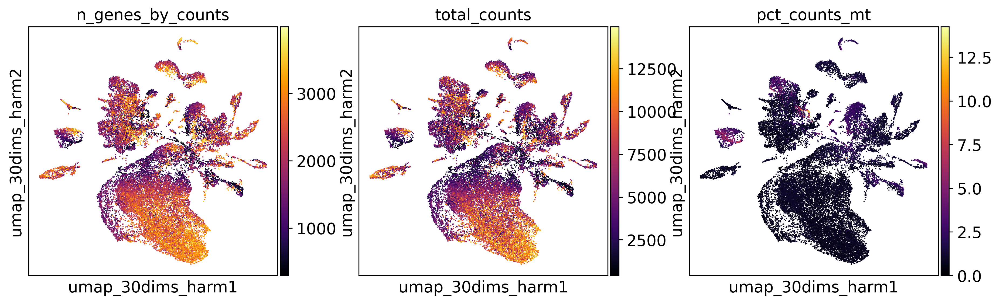

In [134]:
sc.pl.embedding(adata, color = ["n_genes_by_counts", "total_counts", "pct_counts_mt"], basis=basis, cmap='inferno')

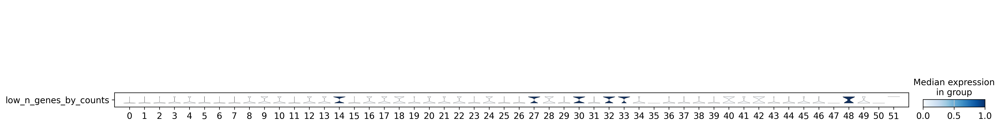

In [132]:
# Create a boolean column for cells with < 1000 total counts
adata.obs['low_n_genes_by_counts'] = adata.obs['n_genes_by_counts'] < 1000
sc.pl.stacked_violin(adata, 'low_n_genes_by_counts', groupby=f'leiden_{basis}_{res}', swap_axes=True);

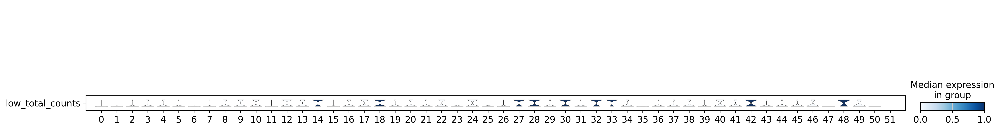

In [135]:
# Create a boolean column for cells with < 1000 total counts
adata.obs['low_total_counts'] = adata.obs['total_counts'] < 2500
sc.pl.stacked_violin(adata, 'low_total_counts', groupby=f'leiden_{basis}_{res}', swap_axes=True);

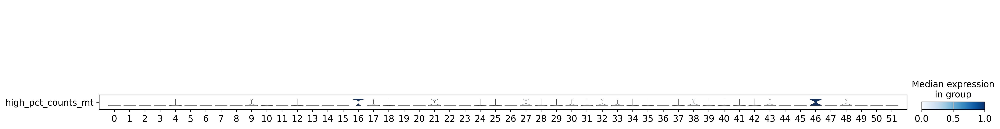

In [137]:
# Create a boolean column for cells with < 1000 total counts
adata.obs['high_pct_counts_mt'] = adata.obs['pct_counts_mt'] > 2.5
sc.pl.stacked_violin(adata, 'high_pct_counts_mt', groupby=f'leiden_{basis}_{res}', swap_axes=True);

In [138]:
clusters_to_remove = ['14', '27', '30', '32', '33', '48']

In [139]:
adata_sub = adata[~adata.obs[resolution].isin(clusters_to_remove)]

In [143]:
adata_sub.write_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality_subset_top2000.h5ad')

# continue with quality filtered subset

In [1]:
import scanpy as sc

save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'

adata = sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality_subset_top2000.h5ad')

In [9]:
sc.tl.pca(adata, n_comps=50)

In [ ]:
# Batch correction using harmony
sc.external.pp.harmony_integrate(adata, key = 'batch', max_iter_harmony=30)

In [ ]:
# dimensionality reduction
comps = [10, 20, 25, 30, 35, 40, 50]

for comp in comps:
    neighbors_key = f'neighbors_{comp}dims_harm'  # Unique neighbors key
    umap_key = f'umap_{comp}dims_harm'           # Unique UMAP key for obsm
    
    sc.pp.neighbors(adata, n_pcs=comp, key_added=neighbors_key, use_rep='X_pca_harmony')
    sc.tl.umap(adata, neighbors_key=neighbors_key)
    adata.obsm[umap_key] = adata.obsm['X_umap']
    
    print(f"Computed UMAP for {comp} components. Stored in adata.obsm['{umap_key}']")

In [ ]:
import pandas as pd
from sklearn.metrics import silhouette_score

# Define resolutions and dimensionality reductions to test
resolutions = [0.05, 0.08, 0.1, 0.12, 0.15, 0.2, 0.5, 1.0]
comps = [10, 20, 25, 30, 35, 40, 50]

# Corresponding reductions and neighbors already computed
reductions = [f'umap_{comp}dims_harm' for comp in comps]  # Keys in adata.obsm
neighbors_keys = [f'neighbors_{comp}dims_harm' for comp in comps]  # Keys in adata

# Initialize a list to store results
results = []

# Loop over each reduction and its corresponding neighbors_key
for reduction, neighbors_key in zip(reductions, neighbors_keys):
    print(f"\nEvaluating Silhouette Scores for Reduction: {reduction} with neighbors {neighbors_key}")
    
    # Loop over each resolution
    for res in resolutions:
        # Run Leiden clustering with the current resolution
        sc.tl.leiden(
            adata,
            resolution=res,
            random_state=0,
            n_iterations=2,
            directed=False,
            neighbors_key=neighbors_key,  # Use the correct neighbors_key
            key_added=f'leiden_{reduction}_{res}'  # Unique key for each reduction-resolution combo
        )
        
        # Retrieve cluster labels
        leiden_key = f'leiden_{reduction}_{res}'
        labels = adata.obs[leiden_key].astype('category').cat.codes

        # Get the embedding for the current reduction
        if reduction in adata.obsm:
            embedding = adata.obsm[reduction]
        else:
            print(f"Warning: {reduction} not found in adata.obsm. Skipping.")
            continue

        # Compute Silhouette Coefficient
        score = silhouette_score(embedding, labels)

        # Append the result as a row to the results list
        results.append({
            'Reduction': reduction,
            'NeighborsKey': neighbors_key,
            'Resolution': res,
            'SilhouetteScore': score
        })
        print(f"Reduction {reduction}, Resolution {res}: Silhouette Coefficient = {score:.3f}")

# Convert results into a pandas DataFrame
silhouette_df = pd.DataFrame(results)

# Display the DataFrame
print("\nSilhouette Coefficients DataFrame:")
print(silhouette_df)

In [13]:
silhouette_df.loc[silhouette_df['SilhouetteScore'].idxmax()]

Reduction               umap_30dims_harm
NeighborsKey       neighbors_30dims_harm
Resolution                          0.05
SilhouetteScore                 0.402869
Name: 24, dtype: object

In [14]:
silhouette_df.to_csv(save_dir + 'Esco_silhouette_score.csv', sep=',')

In [15]:
adata.write_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality_subset_top2000.h5ad')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

heatmap_data = silhouette_df.pivot(index='Resolution', columns='Reduction', values='SilhouetteScore')

plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'SilhouetteScore'})
plt.title('SilhouetteScore Across Reductions and Resolutions', fontsize=14)
plt.xlabel('Dimensionality Reduction', fontsize=12)
plt.ylabel('Resolution', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [17]:
basis = 'umap_10dims_harm'
resolution = f'leiden_{basis}_0.2'
markers=f'{resolution}_markers'

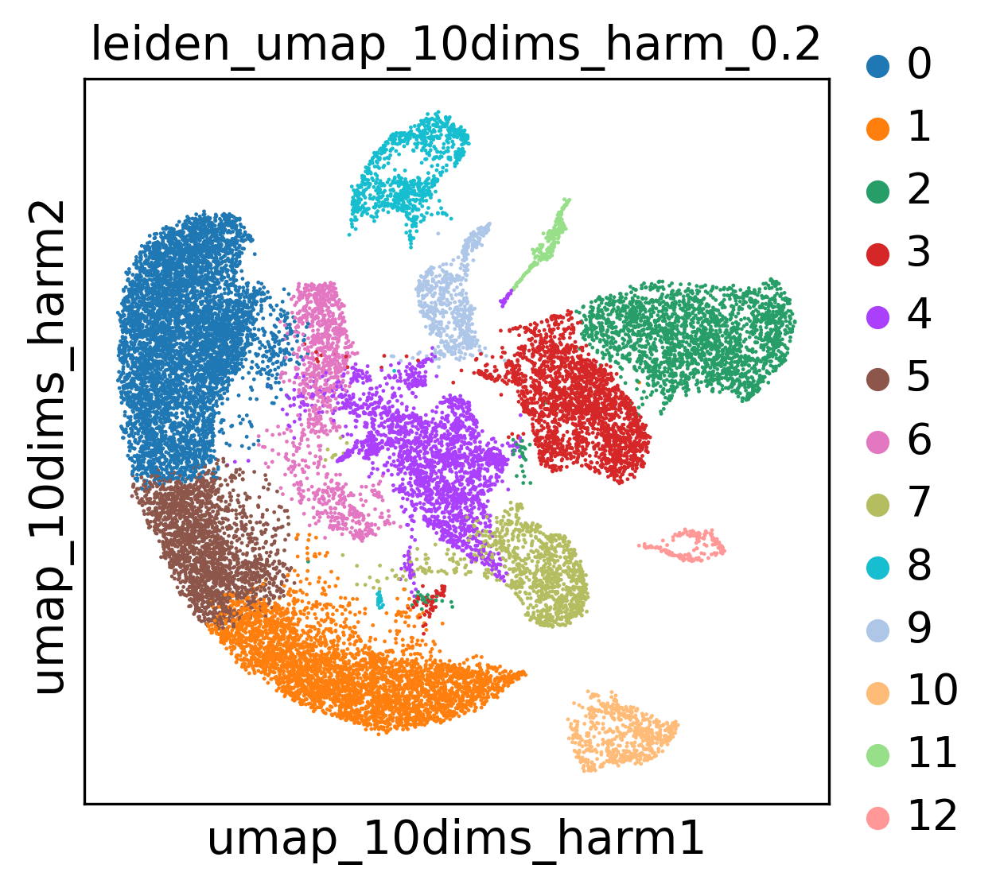

In [18]:
sc.settings.set_figure_params(dpi=150, facecolor="white", color_map='plasma')
sc.pl.embedding(adata, color = resolution, basis=basis)

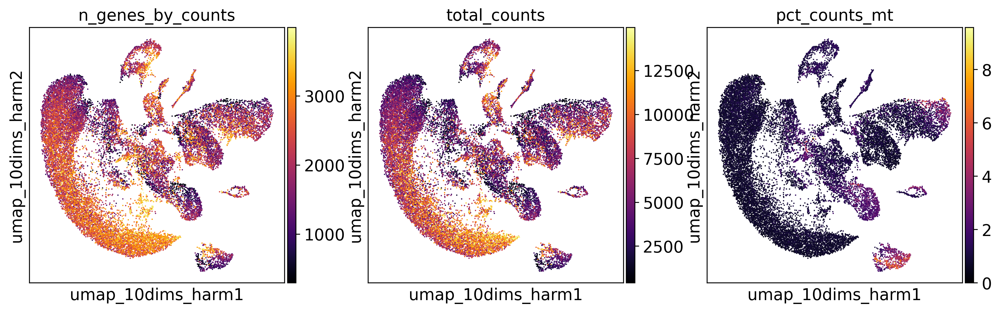

In [35]:
sc.pl.embedding(adata, color = ["n_genes_by_counts", "total_counts", "pct_counts_mt"], basis=basis, cmap='inferno')

# marker genes
here we identified clusters with high ribosomal gene content, in the end we remove them and repeat the analysis

In [45]:
import scanpy as sc
save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'
adata = sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality_subset_top2000.h5ad')

In [46]:
basis = 'umap_10dims_harm'
resolution = f'leiden_{basis}_0.2'
markers=f'{resolution}_markers'

In [47]:
sc.tl.rank_genes_groups(adata, resolution, method="wilcoxon", key_added=f'{resolution}_markers')

In [3]:
import pandas as pd
outdir = '/staging/leuven/stg_00171/Mark/OrthoFinder/look_up_tables/Sep29_2025_tables/'
orthos = pd.read_csv(outdir + 'LookUp_Esco_Dmel_Hsap.tsv', sep='\t')
orthos_red = orthos[['Esco', 'Dmel_fbgn', 'Dmel_id', 'Hsap']]

In [26]:
result = adata.uns[markers]
groups = result["names"].dtype.names 
df = pd.DataFrame(
    {
        f"{group}_{key[:1]}": result[key][group]
        for group in groups
        for key in ["names", "pvals", "logfoldchanges"]
    }
).head(50)

In [ ]:
# cluster 10, ribosomal genes, mitochondrial genes
genes = [
    'LOC145279927', # neo-calmodulin like
    'LOC145291214', # calmodulin like
    'LOC145266317', # advillin-like
    'LOC145297795', # phosphatidylinositol transfer protein 3-like
    'LOC145242473', # synaptobrevin homolog YKT6-like 
    'LOC145248361', # 60 kDa neurofilament protein-like
    'LOC145258261', # sulfate transporter-like
    'LOC145293676', # CD9 antigen
    'LOC145286249', # ATP-synthase F(1) complex subunit epsilon, mitochondrial-like
    'LOC145297625', # solute carrier family 12 member 9-like
    'LOC145286096', # soma ferritin like
    'LOC145294007', # small ribosomoal subunit protein uS14-like 
    'LOC145296772', # small ribosomoal subunit protein uS10 
    'LOC145263712', # glyceraldehyde-3-phosphate dehydrogenase-like
    'LOC145279802', # large ribosomal subunit protein P1-like
    'LOC145292163', # ATP synthase subunit d, mitochondrial-like
    'LOC145291551', # translationally-controlled tumor protein
    'LOC145293932', # elongation factor 1-alpha-like
    'LOC145279683', # annexin
    'LOC145248342', # large ribosomal subunit protein eL28-like
    'LOC145284735', # ATP synthase lipid-binding protein, mitochondrial-like
    'LOC145255776', # large ribosomal subunit protein P2-like 
    'LOC145267080', # ATP synthase F(0) complex subunit e, mitochondrial-like
    'LOC145245761', # small ribosomal subunit protein eS27-like
    'LOC145276770', # large ribosomal subunit protein eL32-like
    'LOC145252481', # bifunctional 3'-phosphoadenosine 5'-phosphosulfate synthase-like
    'LOC145259980', # cytochrome c oxidase subunit FA4-like
    'LOC145260594', # small ribosomal subunit protein uS12
    'LOC145293875', # ubiquitin-ribosomal protein eS31 fusion protein
    'LOC145265622', # large ribosomal subunit protein eL34-like
    'LOC145276365', # ATP synthase subunit a-like 
    'LOC145276976', # ATP synthase F(1) complex subunit alpha, mitochondrial-like 
    'LOC145239787', # large ribosomal subunit protein uL13-like 
    'LOC145254550', # V-type proton ATPase 16 kDa proteolipid subunit c
    'LOC145243896', # large ribosomal subunit protein uL10-like
]



In [ ]:
# cluster 7
genes = [
    'LOC145291214', # calmodulin-like
    'LOC145248361', # 60 kDa neurofilament protein-like
    'LOC145296772', # small ribosomal subunit protein uS10
    'LOC145279802', # large ribosomal subunit protein P1-like
    'LOC145258298', # large ribosomal subunit protein eL36-like
    'LOC145247565', # large ribosomal subunit protein uL29-like
    'LOC145276786', # small ribosomal subunit protein uS17-like
    'LOC145245900', # large ribosomal subunit protein uL24-like
    'LOC145248342', # large ribosomal subunit protein eL28-like4
    'LOC145292980', # small ribosomal subunit protein uS5
    'LOC145293108', # large ribosomal subunit protein eL33-like
    'LOC145276769', # large ribosomal subunit protein uL11-like
]


In [ ]:
## add basic annotation ####
adata.obs['basic_anno'] = adata.obs[resolution].replace({'0':  'NDIFF', 
                                                         '1':  'NDIFF', 
                                                         '2':  'MES', 
                                                         '3':  'MES' , 
                                                         '4':  'EPI', 
                                                         '5':  'NDIFF', 
                                                         '6':  'NRPOG',
                                                         '7':  'ribo',
                                                         '8':  'RET' , 
                                                         '9':  'GLIA', 
                                                         '10': 'ribo', 
                                                         '11': 'EPI', # sensory epithelium
                                                         '12': 'EPI', # multiciliated epithelial cells
                                                        })

In [49]:
adata_sub = adata[~adata.obs[resolution].isin(['7', '10'])]

In [63]:
adata_sub

View of AnnData object with n_obs × n_vars = 21088 × 2000
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch', 'leiden_umap_30dims_harm_2.0', 'low_n_genes_by_counts', 'low_total_counts', 'high_pct_counts_mt', 'leiden_umap_10dims_harm_0.05', 'leiden_umap_10dims_harm_0.08', 'leiden_umap_10dims_harm_0.1', 'leiden_umap_10dims_harm_0.12', 'leiden_umap_10dims_harm_0.15', 'leiden_umap_10dims_harm_0.2', 'leiden_umap_10dims_harm_0.5', 'leiden_umap_10dims_harm_1.0', 'leiden_umap_20dims_harm_0.05', 'leiden_umap_20dims_harm_0.08', 'leiden_umap_20dims_harm_0.1', 'leiden_umap_20dims_harm_0.12', 'leiden_umap_20dims_harm_0.15', 'leiden_umap_20dims_harm_0.2', 'leiden_umap_20dims_harm_0.5', 'leiden_umap_20dims_harm_1.0', 'leiden_umap_25dims_harm_0.05', 'leiden_umap_25dims_harm_0.08', 'leiden_umap_25dims_harm_0.1', 'l

In [64]:
adata_sub.write_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality2_subset_top2000.h5ad')

# processing of quality dataset part 2

In [2]:
import scanpy as sc

save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'

adata = sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality2_subset_top2000.h5ad')

In [67]:
sc.tl.pca(adata, n_comps=50)

In [ ]:
# Batch correction using harmony
sc.external.pp.harmony_integrate(adata, key = 'batch', max_iter_harmony=30)

In [ ]:
# dimensionality reduction
comps = [10, 20, 25, 30, 35, 40, 50]

for comp in comps:
    neighbors_key = f'neighbors_{comp}dims_harm'  # Unique neighbors key
    umap_key = f'umap_{comp}dims_harm'           # Unique UMAP key for obsm
    
    sc.pp.neighbors(adata, n_pcs=comp, key_added=neighbors_key, use_rep='X_pca_harmony')
    sc.tl.umap(adata, neighbors_key=neighbors_key)
    adata.obsm[umap_key] = adata.obsm['X_umap']
    
    print(f"Computed UMAP for {comp} components. Stored in adata.obsm['{umap_key}']")

In [ ]:
import pandas as pd
from sklearn.metrics import silhouette_score

# Define resolutions and dimensionality reductions to test
resolutions = [0.05, 0.08, 0.1, 0.12, 0.15, 0.2, 0.5, 1.0]
comps = [10, 20, 25, 30, 35, 40, 50]

# Corresponding reductions and neighbors already computed
reductions = [f'umap_{comp}dims_harm' for comp in comps]  # Keys in adata.obsm
neighbors_keys = [f'neighbors_{comp}dims_harm' for comp in comps]  # Keys in adata

# Initialize a list to store results
results = []

# Loop over each reduction and its corresponding neighbors_key
for reduction, neighbors_key in zip(reductions, neighbors_keys):
    print(f"\nEvaluating Silhouette Scores for Reduction: {reduction} with neighbors {neighbors_key}")
    
    # Loop over each resolution
    for res in resolutions:
        # Run Leiden clustering with the current resolution
        sc.tl.leiden(
            adata,
            resolution=res,
            random_state=0,
            n_iterations=2,
            directed=False,
            neighbors_key=neighbors_key,  # Use the correct neighbors_key
            key_added=f'leiden_{reduction}_{res}'  # Unique key for each reduction-resolution combo
        )
        
        # Retrieve cluster labels
        leiden_key = f'leiden_{reduction}_{res}'
        labels = adata.obs[leiden_key].astype('category').cat.codes

        # Get the embedding for the current reduction
        if reduction in adata.obsm:
            embedding = adata.obsm[reduction]
        else:
            print(f"Warning: {reduction} not found in adata.obsm. Skipping.")
            continue

        # Compute Silhouette Coefficient
        score = silhouette_score(embedding, labels)

        # Append the result as a row to the results list
        results.append({
            'Reduction': reduction,
            'NeighborsKey': neighbors_key,
            'Resolution': res,
            'SilhouetteScore': score
        })
        print(f"Reduction {reduction}, Resolution {res}: Silhouette Coefficient = {score:.3f}")

# Convert results into a pandas DataFrame
silhouette_df = pd.DataFrame(results)

# Display the DataFrame
print("\nSilhouette Coefficients DataFrame:")
print(silhouette_df)

In [71]:
silhouette_df.loc[silhouette_df['SilhouetteScore'].idxmax()]

Reduction               umap_35dims_harm
NeighborsKey       neighbors_35dims_harm
Resolution                          0.05
SilhouetteScore                 0.469874
Name: 32, dtype: object

In [72]:
silhouette_df.to_csv(save_dir + 'Esco_silhouette_score.csv', sep=',')

In [73]:
adata.write_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality2_subset_top2000.h5ad')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

heatmap_data = silhouette_df.pivot(index='Resolution', columns='Reduction', values='SilhouetteScore')

plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'SilhouetteScore'})
plt.title('SilhouetteScore Across Reductions and Resolutions', fontsize=14)
plt.xlabel('Dimensionality Reduction', fontsize=12)
plt.ylabel('Resolution', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [82]:
basis = 'umap_10dims_harm'
resolution = f'leiden_{basis}_0.2'
markers=f'{resolution}_markers'

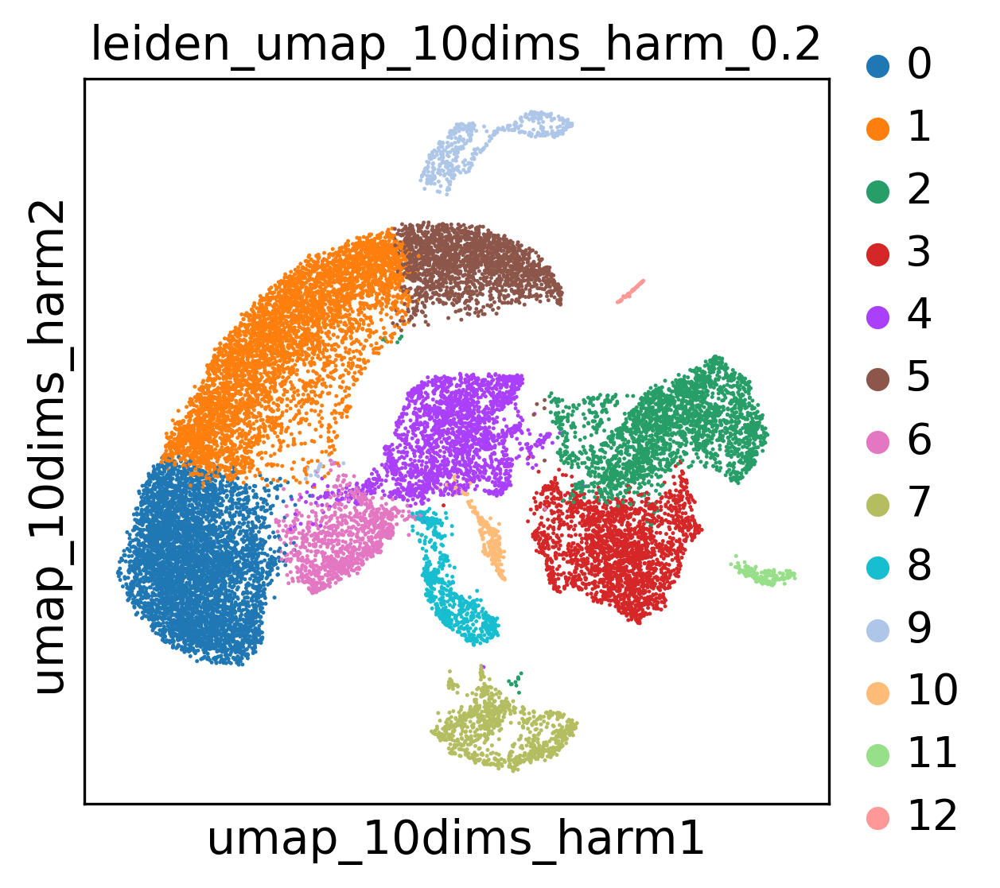

In [83]:
sc.settings.set_figure_params(dpi=150, facecolor="white", color_map='plasma')
sc.pl.embedding(adata, color = resolution, basis=basis)

In [85]:
result = adata.uns[markers]
groups = result["names"].dtype.names 
df = pd.DataFrame(
    {
        f"{group}_{key[:1]}": result[key][group]
        for group in groups
        for key in ["names", "pvals", "logfoldchanges"]
    }
).head(50)

In [ ]:
cluster = 9
columns_to_extract = [f"{cluster}_n", f"{cluster}_p", f"{cluster}_l"]
new_df = df[columns_to_extract]
new_df.sort_values(by = f'{cluster}_l', ascending=False, inplace=True)
#df_2 = new_df.merge(orthos_red, how='left', left_on=f'{cluster}_n', right_on='Esco')
#df_2.to_csv(marker_dir + f'cluster_{cluster}')
new_df

In [103]:
## add basic annotation ####
adata.obs['samap_anno'] = adata.obs[resolution].replace({'0':  'NDIFF', 
                                                         '1':  'NDIFF', 
                                                         '2':  'MES', 
                                                         '3':  'MES' , 
                                                         '4':  'EPI', 
                                                         '5':  'NDIFF', 
                                                         '6':  'NPROG',
                                                         '7':  'RET',
                                                         '8':  'GLIA' , 
                                                         '9':  'NDIFF', 
                                                         '10': 'EPI', 
                                                         '11': 'ENDOT', # sensory epithelium
                                                         '12': 'EPI', # multiciliated epithelial cells
                                                        })

/tmp/ipykernel_1396996/2170243892.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['samap_anno'] = adata.obs[resolution].replace({'0':  'NDIFF',


In [104]:
adata.obs['samap_anno'].value_counts()

samap_anno
NDIFF    11891
MES       4407
EPI       2278
NPROG      953
RET        829
GLIA       587
ENDOT      143
Name: count, dtype: int64

In [105]:
adata.write_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality2_subset_top2000.h5ad')

# extract annotation and create a dataset with only the essential umap for UCSC

In [1]:
import scanpy as sc
save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'
adata= sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality2_subset_top2000.h5ad')

In [2]:
adata.obs['samap_anno']

barcode
TCTCAATTCTCGCCCA-1-E_1      MES
TTGACGTAGGTTACAC-1-E_1    NDIFF
CCGCCAACACAATGCC-1-E_1    NDIFF
GGGCATTGTTGGTTCT-1-E_1    NDIFF
CAATCCTGTCATTACC-1-E_1      RET
                          ...  
CTCGCTAGTTAAGCCA-1-E_2    NDIFF
TTAGGCGTCGTTCACC-1-E_2      RET
CTCATTGTCTGTTCAT-1-E_2    NPROG
CGGTTGGGTCACAGAC-1-E_2    NDIFF
ATCACACAGAGGATAT-1-E_2    NDIFF
Name: samap_anno, Length: 21088, dtype: category
Categories (7, object): ['NDIFF', 'MES', 'EPI', 'NPROG', 'RET', 'GLIA', 'ENDOT']

In [3]:
adata_pre = sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged.h5ad')

In [5]:
adata_pre

AnnData object with n_obs × n_vars = 24609 × 17888
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [6]:
adata_pre.obs['annotation'] = adata.obs['samap_anno']

In [7]:
adata_pre.obs['annotation']

barcode
TCTCAATTCTCGCCCA-1-E_1      MES
TTGACGTAGGTTACAC-1-E_1    NDIFF
GCCTTTGGTGATCATG-1-E_1      NaN
CCGCCAACACAATGCC-1-E_1    NDIFF
GGGCATTGTTGGTTCT-1-E_1    NDIFF
                          ...  
AAGACAAGTGTTGCTT-1-E_2      NaN
TTAGGCGTCGTTCACC-1-E_2      RET
CTCATTGTCTGTTCAT-1-E_2    NPROG
CGGTTGGGTCACAGAC-1-E_2    NDIFF
ATCACACAGAGGATAT-1-E_2    NDIFF
Name: annotation, Length: 24609, dtype: category
Categories (7, object): ['NDIFF', 'MES', 'EPI', 'NPROG', 'RET', 'GLIA', 'ENDOT']

In [8]:
adata_final = adata_pre[adata_pre.obs['annotation'].notna()].copy()

In [9]:
adata_final

AnnData object with n_obs × n_vars = 21088 × 17888
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch', 'annotation'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [ ]:
# get the adata_final barcodes in the same order as in the adata_old object

In [10]:
# Reorder adata_old to match adata_final
adata_old_reordered = adata[adata_final.obs_names].copy()

# Transfer UMAP
adata_final.obsm['umap_10dims_harm'] = adata_old_reordered.obsm['umap_10dims_harm'].copy()

# Transfer neighbor graphs
adata_final.obsp['neighbors_10dims_harm_connectivities'] = (
    adata_old_reordered.obsp['neighbors_10dims_harm_connectivities'].copy()
)
adata_final.obsp['neighbors_10dims_harm_distances'] = (
    adata_old_reordered.obsp['neighbors_10dims_harm_distances'].copy()
)

In [11]:
adata

AnnData object with n_obs × n_vars = 21088 × 2000
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch', 'leiden_umap_30dims_harm_2.0', 'low_n_genes_by_counts', 'low_total_counts', 'high_pct_counts_mt', 'leiden_umap_10dims_harm_0.05', 'leiden_umap_10dims_harm_0.08', 'leiden_umap_10dims_harm_0.1', 'leiden_umap_10dims_harm_0.12', 'leiden_umap_10dims_harm_0.15', 'leiden_umap_10dims_harm_0.2', 'leiden_umap_10dims_harm_0.5', 'leiden_umap_10dims_harm_1.0', 'leiden_umap_20dims_harm_0.05', 'leiden_umap_20dims_harm_0.08', 'leiden_umap_20dims_harm_0.1', 'leiden_umap_20dims_harm_0.12', 'leiden_umap_20dims_harm_0.15', 'leiden_umap_20dims_harm_0.2', 'leiden_umap_20dims_harm_0.5', 'leiden_umap_20dims_harm_1.0', 'leiden_umap_25dims_harm_0.05', 'leiden_umap_25dims_harm_0.08', 'leiden_umap_25dims_harm_0.1', 'leiden_um

In [12]:
adata_final

AnnData object with n_obs × n_vars = 21088 × 17888
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch', 'annotation'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2'
    obsm: 'cellbender_embedding', 'umap_10dims_harm'
    layers: 'cellbender', 'raw'
    obsp: 'neighbors_10dims_harm_connectivities', 'neighbors_10dims_harm_distances'

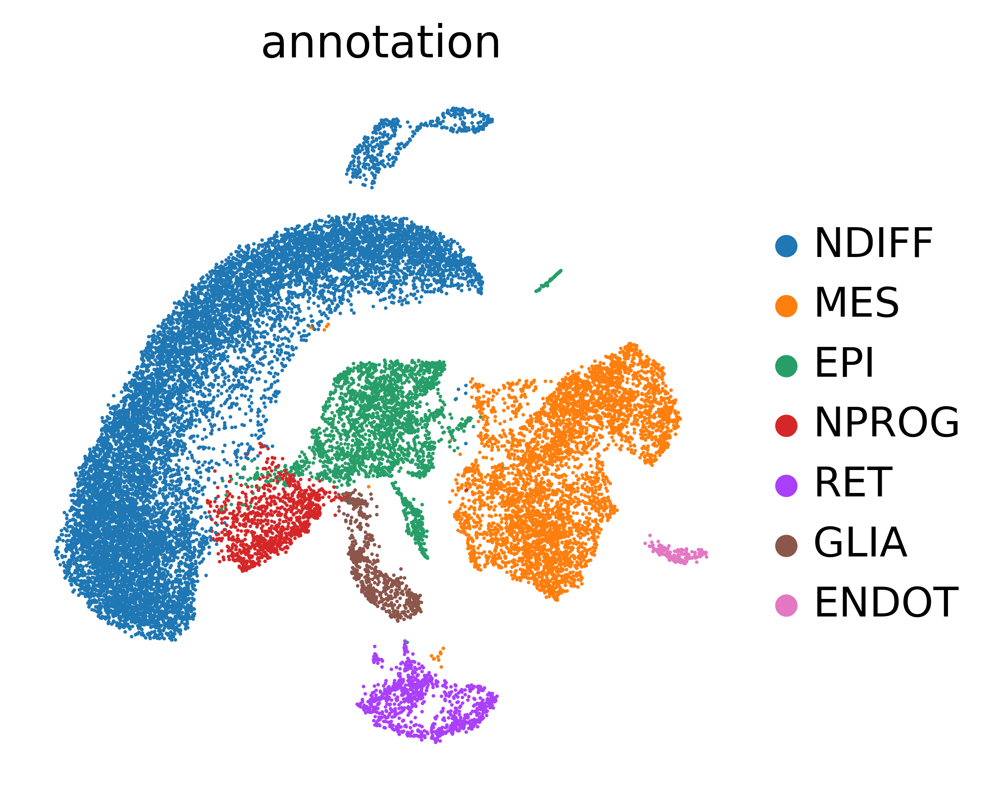

In [14]:
sc.settings.set_figure_params(dpi=300, facecolor="white", color_map='inferno')
sc.settings.figdir = 'figures/paper/Figure 9/'

basis = 'umap_10dims_harm'

sc.pl.embedding(adata_final, color = 'annotation', basis=basis, frameon=False, size=5,
               #save='_Esco_batches.pdf'
               )

In [15]:
import scanpy as sc
save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'
adata_final.write_h5ad(save_dir + 'Esco_UCSC.h5ad')

# save adata object for samap

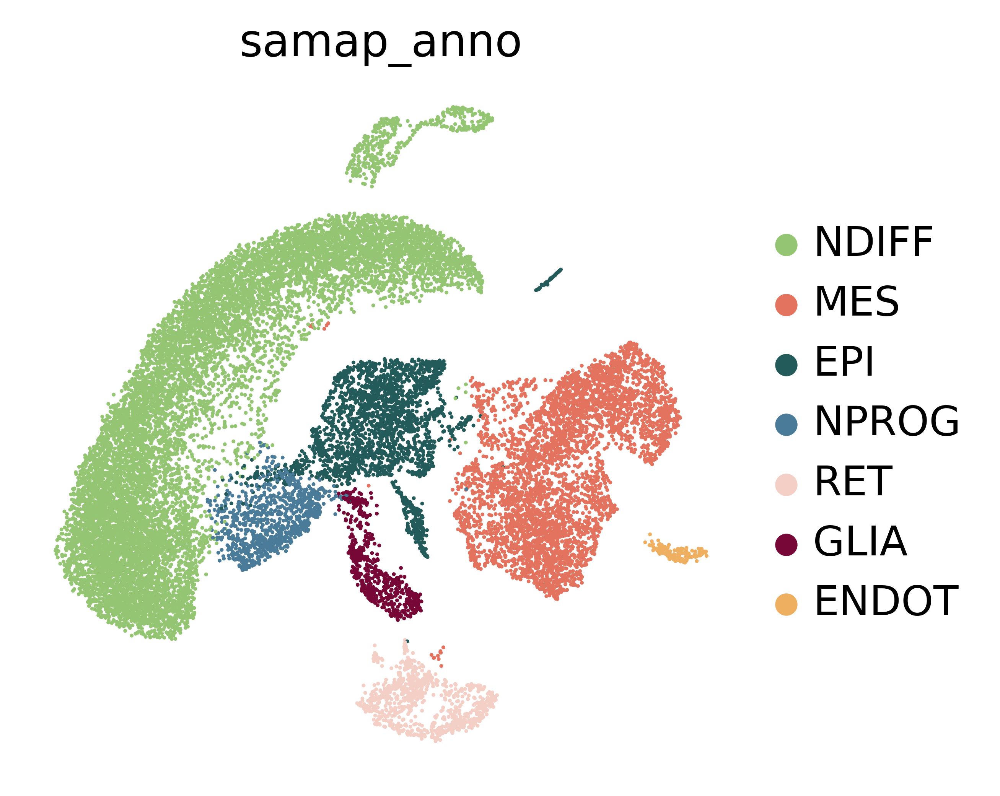

In [106]:
sc.settings.set_figure_params(dpi=300, facecolor="white", color_map='plasma', frameon=False)
sc.settings.figdir = 'figures/paper/Figure 9/Esco_ncbi_genome/'

coarse_colors = ['#93C572', '#E3735E', '#235a5a', '#4a7c99', '#F3CFC6', '#770737', '#eeaf61'] 

sc.pl.embedding(adata, color = ['samap_anno'], basis=basis, palette=coarse_colors,
               save='_Esco_samap_anno.pdf')

In [93]:
import scanpy as sc
import anndata.io
save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'
adata_pre = sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged.h5ad')

In [107]:
adata_pre

AnnData object with n_obs × n_vars = 24609 × 17888
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch', 'samap_anno'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [108]:
adata_pre.obs['samap_anno'] = adata.obs['samap_anno']

In [109]:
samap = adata_pre[adata_pre.obs['samap_anno'].notna()].copy()

In [110]:
samap

AnnData object with n_obs × n_vars = 21088 × 17888
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch', 'samap_anno'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-E_1', 'cellbender_analyzed-E_1', 'n_raw-E_1', 'n_cellbender-E_1', 'n_cells-E_1', 'n_cells_by_counts-E_1', 'mean_counts-E_1', 'pct_dropout_by_counts-E_1', 'total_counts-E_1', 'ambient_expression-E_2', 'cellbender_analyzed-E_2', 'n_raw-E_2', 'n_cellbender-E_2', 'n_cells-E_2', 'n_cells_by_counts-E_2', 'mean_counts-E_2', 'pct_dropout_by_counts-E_2', 'total_counts-E_2'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [111]:
samap.write_h5ad(save_dir + 'Esco_for_samap.h5ad')

In [112]:
print(save_dir + 'Esco_for_samap.h5ad')

/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/Esco_for_samap.h5ad


# plotting

In [ ]:
import scanpy as sc
import anndata.io
save_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis_ncbi/'
adata = sc.read_h5ad(save_dir + 'Esco_cb_sc_scr_merged_quality2_subset_top2000.h5ad')

In [ ]:
import pandas as pd
ortho_file = '/staging/leuven/stg_00171/Mark/OrthoFinder/look_up_tables/July_2026_tables/Esco_NCBI_vs_Mmus_vs_Ovul_vs_Pcan.tsv'
orthos = pd.read_csv(ortho_file, sep='\t')
orthos_red = orthos[['Esco_gene_id', 'Mmus_gene_symbol']]

In [ ]:
mask = orthos.astype(str).apply(
    lambda col: col.str.contains("Dlx", na=False)
)

orthos[mask.any(axis=1)]

In [2]:
adata.obs['batch'].value_counts()

batch
E_2    10735
E_1    10353
Name: count, dtype: int64

In [2]:
batches = ['E_1', 'E_2']
obs = 'batch'

for batch in batches:
    adata.obs[f'highlight_{batch}'] = adata.obs[obs].isin([batch])

In [4]:
adata.obs[f'highlight_E_1'].dtype

dtype('bool')

In [ ]:
sc.settings.set_figure_params(dpi=300, facecolor="white", color_map='inferno', frameon=False)
sc.settings.figdir = 'figures/misc/'

basis = 'umap_10dims_harm'

gene = [
    '', # DLX
    'LOC145291274', # PROS
       ]

sc.pl.embedding(adata, color=gene, basis=basis, save='_Esco_NKX21-24_NKX61-62-63.pdf')

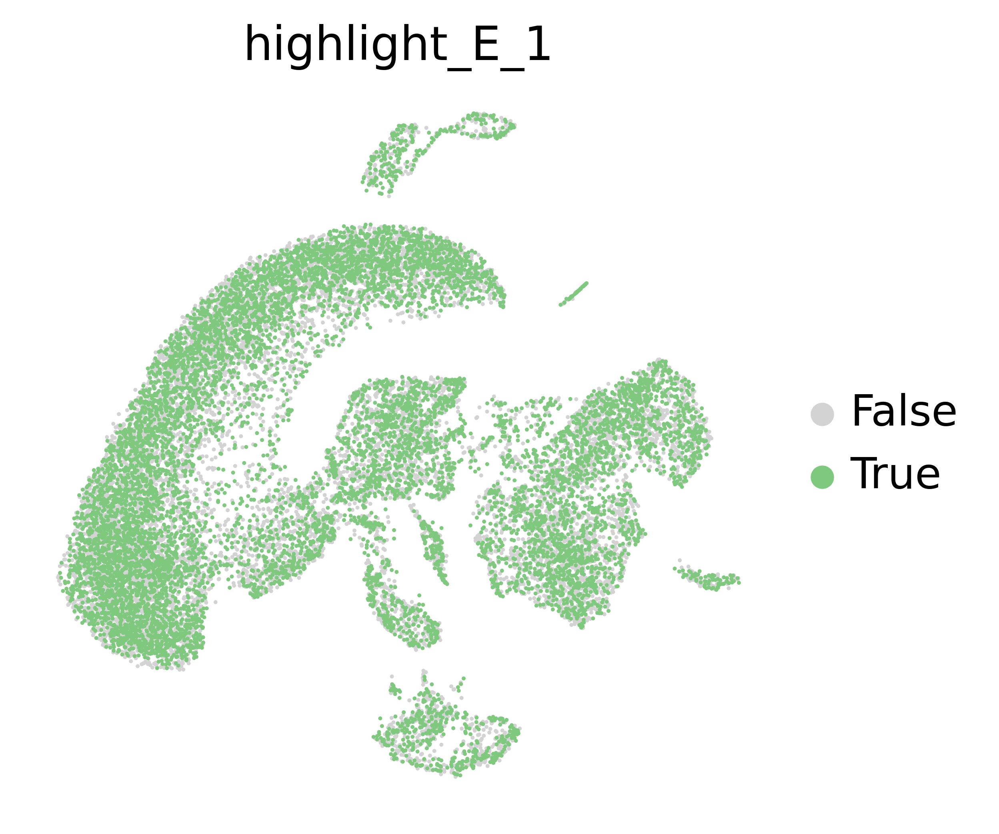

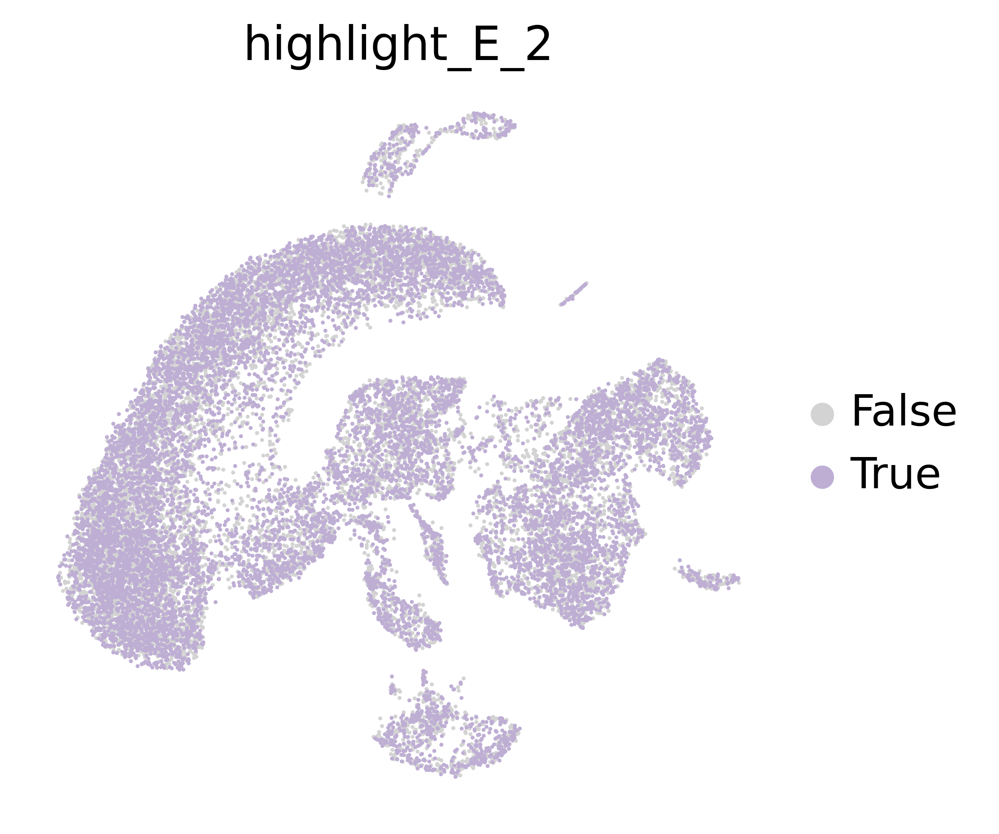

In [6]:
import numpy as np
batches = ['E_1', 'E_2']
colors = ['#7fc97f','#beaed4']

basis = 'umap_10dims_harm'

sc.settings.set_figure_params(dpi=300, facecolor="white", color_map='inferno', frameon=False)
sc.settings.figdir = 'figures/paper/revision/Supplementary/'

for col, batch in zip(colors, batches):
    mask=adata.obs[f'highlight_{batch}']
    adata_plot = adata[np.r_[np.where(~mask)[0], np.where(mask)[0]]].copy()
    
    sc.pl.embedding(
        adata_plot,
        basis=basis,
        color=[f"highlight_{batch}"],
        palette=["lightgrey", col],
        save=f'_Esco_batch_{batch}_umap.pdf'
    )


In [2]:
adata.obs['samap_anno'].value_counts()

samap_anno
NDIFF    11891
MES       4407
EPI       2278
NPROG      953
RET        829
GLIA       587
ENDOT      143
Name: count, dtype: int64

In [2]:
import pandas as pd
outdir = '/staging/leuven/stg_00171/Mark/OrthoFinder/look_up_tables/Sep29_2025_tables/'
orthos = pd.read_csv(outdir + 'LookUp_Esco_Dmel_Hsap.tsv', sep='\t')
orthos_red = orthos[['Esco', 'Dmel_fbgn', 'Dmel_id', 'Hsap']]

In [5]:
mask = orthos_red.astype(str).apply(
    lambda col: col.str.contains("elav", na=False)
)

orthos_red[mask.any(axis=1)]

,Esco,Dmel_fbgn,Dmel_id,Hsap
13419,g5256,"FBgn0010263,FBgn0086675,FBgn0260400","Rbp9,elav,fne","ELAV1,ELAV2,ELAV3,ELAV4"


In [1]:
import pandas as pd
outdir = '/staging/leuven/stg_00171/Mark/OrthoFinder/look_up_tables/Sep29_2025_tables/'
orthos_ovul = pd.read_csv(outdir + 'Esco_vs_Ovul_MP_TD.tsv', sep='\t')


In [9]:
mask = orthos_ovul.astype(str).apply(
    lambda col: col.str.contains("Oct", na=False)
)

orthos_ovul[mask.any(axis=1)]

,Orthogroup,Esco,Ovul_MP_TD


In [11]:
import matplotlib as mpl
mpl.colormaps['Accent'].colors

((0.4980392156862745, 0.788235294117647, 0.4980392156862745),
 (0.7450980392156863, 0.6823529411764706, 0.8313725490196079),
 (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
 (1.0, 1.0, 0.6),
 (0.2196078431372549, 0.4235294117647059, 0.6901960784313725),
 (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
 (0.7490196078431373, 0.3568627450980392, 0.09019607843137253),
 (0.4, 0.4, 0.4))

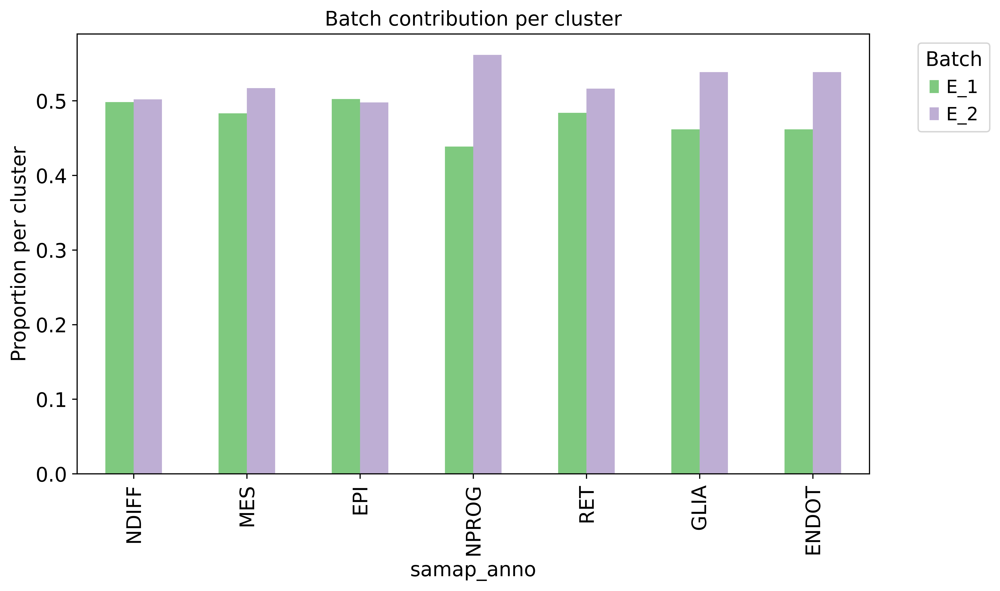

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Replace with your actual column names
cluster_col = 'samap_anno'
batch_col = 'batch'

# Create a contingency table: number of cells per (cluster, batch)
contingency = pd.crosstab(adata.obs[cluster_col], adata.obs[batch_col])

# Normalize to proportions (per cluster)
proportions = contingency.div(contingency.sum(axis=1), axis=0)

# Plot
proportions.plot(kind='bar', stacked=False, figsize=(10,6), color=['#7fc97f','#beaed4'])
plt.ylabel('Proportion per cluster')
plt.title('Batch contribution per cluster')
plt.legend(title='Batch', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(False)
plt.savefig('figures/paper/Figure 9/batch_contribution_anno.pdf', dpi=300)
plt.show()

In [ ]:
sc.settings.set_figure_params(dpi=300, facecolor="white", color_map='inferno')
sc.settings.figdir = 'figures/paper/Figure 9/'

basis = 'umap_10dims_harm'
genes = [
    'LOC145247275', # achaete scute homolog 1A
    'LOC145292144', # neuroD
    'LOC145296020', # ELAV like protein 1
    'LOC145247806', # NR4A
]


sc.pl.embedding(adata, color = genes, basis=basis, frameon=False,
               save='_ascl1_neuroD_elav_nr4a.pdf'
               )

# marker genes

In [2]:
sc.tl.rank_genes_groups(adata, 'samap_anno', method="wilcoxon", key_added='samap_anno_markers')

In [15]:
import pandas as pd
ortho_file = '/staging/leuven/stg_00171/Mark/OrthoFinder/look_up_tables/July_2026_tables/Esco_NCBI_vs_Mmus_vs_Ovul_vs_Pcan.tsv'
orthos = pd.read_csv(ortho_file, sep='\t')
orthos_red = orthos[['Esco_gene_id', 'Mmus_gene_symbol']]

In [38]:
mask = orthos.astype(str).apply(
    lambda col: col.str.contains("Asc", na=False)
)

orthos[mask.any(axis=1)]

,Orthogroup,Ovul_MP_TD,Mmus_gene_symbol,Esco_gene_id,Pcan_gene_id
387450,OG0001205,OctVul6B025607,Ascl1,LOC145247275,LOC112567253
387451,OG0001205,OctVul6B025607,Ascl2,LOC145247275,LOC112567253
391958,OG0003176,OctVul6B018959,Ascc3,LOC145291416,LOC112566838
394486,OG0005277,OctVul6B011796,Ascc1,LOC145287898,LOC112555955
396191,OG0007321,OctVul6B002973,Ascc2,LOC145277720,LOC112567672


In [9]:
result = adata.uns['samap_anno_markers']
groups = result["names"].dtype.names 
df = pd.DataFrame(
    {
        f"{group}_{key[:1]}": result[key][group]
        for group in groups
        for key in ["names", "pvals", "logfoldchanges"]
    }
).head(50)

In [17]:
orthos_red

,Esco_gene_id,Mmus_gene_symbol
0,LOC145287707,Rps10
1,LOC145287707,Rps10
2,LOC145287707,Rps10
3,LOC145287707,Rps10
4,LOC145287707,Rps10
...,...,...
397647,LOC145298595,Trabd2b
397648,LOC145300836,Tmem231
397649,LOC145303450,Ak8
397650,LOC145303453,Ssna1


In [18]:
collapsed = (
    orthos_red.groupby("Esco_gene_id", as_index=False)
      .agg({
          "Mmus_gene_symbol": lambda x: ";".join(x.dropna().astype(str).unique())
      })
)

In [19]:
collapsed

,Esco_gene_id,Mmus_gene_symbol
0,LOC145239750,Btbd9
1,LOC145239751,Gm13698;Gm13693;Gm13696;Gm13694;Gm13697;Gm1369...
2,LOC145239752,Gdap2
3,LOC145239753,Ckmt2;Ckmt1;Ckb;Ckm
4,LOC145239760,Kras;Nras;Hras
...,...,...
8173,LOC145303656,Madd
8174,LOC145303659,Kcnn1;Kcnn2;Kcnn3
8175,LOC145303661,Nat10
8176,LOC145303663,Tiam2;Tiam1


In [35]:
cluster = 'GLIA'

marker_dir = 'tables/Esco_markers/'
columns_to_extract = [f"{cluster}_n", f"{cluster}_p", f"{cluster}_l"]
new_df = df[columns_to_extract]
new_df.sort_values(by = f'{cluster}_l', ascending=False, inplace=True)
df_2 = new_df.merge(collapsed, how='left', left_on=f'{cluster}_n', right_on='Esco_gene_id')
df_2.to_csv(marker_dir + f'cluster_{cluster}.csv')
df_2['Esco_gene_id']
df_2

/tmp/ipykernel_3733450/557244290.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df.sort_values(by = f'{cluster}_l', ascending=False, inplace=True)


,GLIA_n,GLIA_p,GLIA_l,Esco_gene_id,Mmus_gene_symbol
0,LOC145284533,1.764351e-262,9.180636,LOC145284533,Dlx4;Dlx1;Dlx6
1,LOC145268427,5.136173e-207,8.268744,LOC145268427,Nid2;Gm2399;Nid1
2,LOC145247806,2.200414e-200,8.168842,LOC145247806,Nr4a1;Nr4a3;Nr4a2
3,LOC145269296,1.268313e-224,8.020473,NaN,NaN
4,LOC145248261,1.394210e-246,7.900721,NaN,NaN
5,LOC145252739,4.532551e-176,7.887506,NaN,NaN
6,LOC145258239,1.474382e-208,7.810962,NaN,NaN
7,LOC145246077,3.109614e-145,7.710821,NaN,NaN
8,LOC145260694,1.199172e-164,7.417433,LOC145260694,Prox2
9,LOC145249742,1.307702e-203,7.279042,LOC145249742,Chsy1;Chsy3


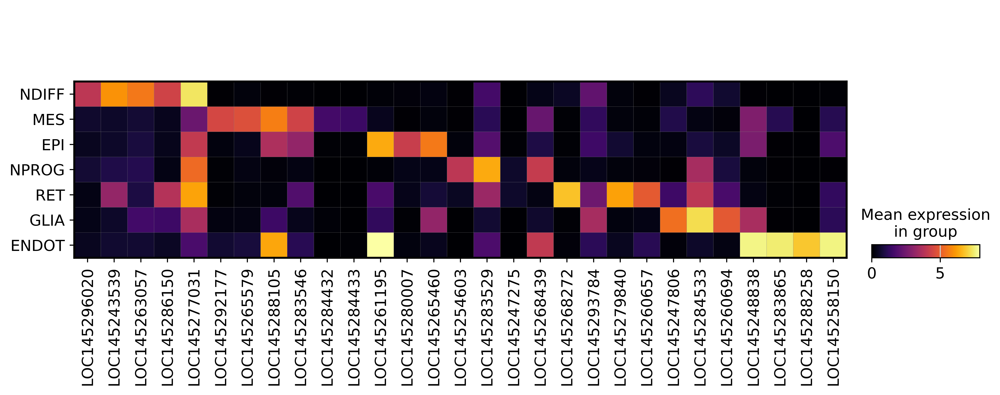

In [37]:
genes = [
     'LOC145296020', # ELAV              N -DIFF
    'LOC145243539', # NRXN
    'LOC145263057', # POU6f1/2
    'LOC145286150', # Syt1/2
    'LOC145277031', # onecut
    
    'LOC145292177', # Col5a3;Col11a2;Col11a1;Col5a1        MES
    'LOC145265579', # Myh
    'LOC145288105', # Col4a3;Col4a1;Col4a5;Col4a4;Col4a6;Col4a2
    'LOC145283546', # FGFR
    'LOC145284432', # MEOX
    'LOC145284433', # MEOX
    
    'LOC145261195', # LAMA3        EPI
    'LOC145280007', # GRHL1
    'LOC145265460', # Actb
   
    'LOC145254603', # SNAI2            N-Prog
    'LOC145283529', # MKI67
    'LOC145247275', # ascl1
    'LOC145268439', # PRDM16

     'LOC145268272', # OTX           RET
    'LOC145293784', # Mitf
    'LOC145279840', # RAb32
    'LOC145260657', # TDO2
    
    'LOC145247806', # NR4A            GLIA
    'LOC145284533', # DLX
    'LOC145260694', # PROX1/2
    'LOC145248838', # Pnt

    'LOC145283865', # NKX2        ENDOT
    'LOC145288258', # Stab2
    'LOC145258150', # Flt1(VGFR)
   
]


sc.settings.set_figure_params(dpi=300, facecolor="white")
sc.settings.figdir = 'figures/paper/revision/'

sc.pl.matrixplot(adata, var_names = genes, groupby ='samap_anno', cmap='inferno', swap_axes=False, save='_Esco_markers.pdf');
    